In [1]:
"""
Reference = https://keras.io/examples/vision/super_resolution_sub_pixel/
"""
import tensorflow as tf

import os
import math
import numpy as np

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.utils import load_img
from tensorflow.keras.utils import array_to_img
from tensorflow.keras.utils import img_to_array
from tensorflow.keras.preprocessing import image_dataset_from_directory

from IPython.display import display

In [2]:
dataset_url = "http://www.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz"
data_dir = keras.utils.get_file(origin=dataset_url, fname="BSR", untar=True)
root_dir = os.path.join(data_dir, "BSDS500/data")

In [3]:
print(root_dir)

/Users/mayo/.keras/datasets/BSR/BSDS500/data


Found 500 files belonging to 1 classes.
Using 400 files for training.
Found 500 files belonging to 1 classes.
Using 100 files for validation.
===== initial ds by image_dataset_from_directory =====
size of ds = 50
batched num = 8
img shape = (300, 300, 3)


2023-09-27 16:32:06.660950: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


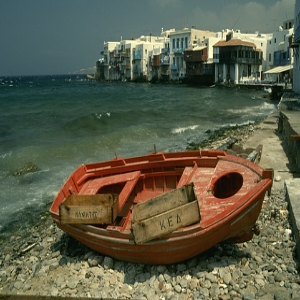

In [4]:
crop_size = 300
upscale_factor = 3
input_size = crop_size // upscale_factor
batch_size = 8

train_ds = image_dataset_from_directory(
    root_dir,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="training",
    seed=1337,
    label_mode=None,
)

valid_ds = image_dataset_from_directory(
    root_dir,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="validation",
    seed=1337,
    label_mode=None,
)

def dbg_print_shape(in_ds, is_img_2nd_bucket=False):
    print(f"size of ds = {sum(1 for a_ in in_ds)}")
    if is_img_2nd_bucket:
        for bb in in_ds.take(1):
            print(f"batched num = {len(bb[1])}")
            for img in bb[0]:
                print(f"batch 0 img shape = {img.shape}")
                display(array_to_img(img))
                break
            for img in bb[1]:
                print(f"batch 1 img shape = {img.shape}")
                display(array_to_img(img))
                break
            break
    else:
        for bb in in_ds.take(1):
            print(f"batched num = {len(bb)}")
            for img in bb:
                print(f"img shape = {img.shape}")
                display(array_to_img(img))
                break
            break
print("===== initial ds by image_dataset_from_directory =====")
dbg_print_shape(train_ds)

In [5]:
def scaling(input_image):
    input_image = input_image / 255.0
    return input_image


# Scale from (0, 255) to (0, 1)
train_ds = train_ds.map(scaling)
valid_ds = valid_ds.map(scaling)

In [6]:
dataset = os.path.join(root_dir, "images")
test_path = os.path.join(dataset, "test")

test_img_paths = sorted(
    [
        os.path.join(test_path, fname)
        for fname in os.listdir(test_path)
        if fname.endswith(".jpg")
    ]
)

<_TakeDataset element_spec=(TensorSpec(shape=(None, 100, 100, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 300, 300, 1), dtype=tf.float32, name=None))>
===== remap ds by process_input and process_target =====
size of ds = 50
batched num = 8
batch 0 img shape = (100, 100, 1)


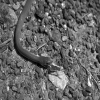

batch 1 img shape = (300, 300, 1)


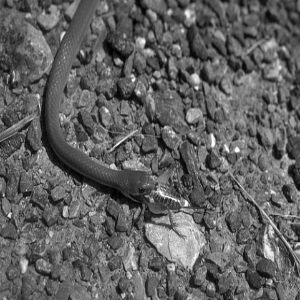

===== remap ds by prefetch buffer_size = 32 =====
size of ds = 50
batched num = 8
batch 0 img shape = (100, 100, 1)


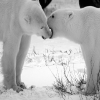

batch 1 img shape = (300, 300, 1)


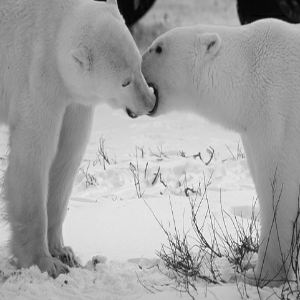

In [7]:
# Use TF Ops to process.
def process_input(input, input_size, upscale_factor):
    input = tf.image.rgb_to_yuv(input)
    last_dimension_axis = len(input.shape) - 1
    y, u, v = tf.split(input, 3, axis=last_dimension_axis)
    return tf.image.resize(y, [input_size, input_size], method="area")


def process_target(input):
    input = tf.image.rgb_to_yuv(input)
    last_dimension_axis = len(input.shape) - 1
    y, u, v = tf.split(input, 3, axis=last_dimension_axis)
    return y

train_ds = train_ds.map(
    lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)
print(train_ds.take(1))

print("===== remap ds by process_input and process_target =====")
dbg_print_shape(train_ds, is_img_2nd_bucket=True)

train_ds = train_ds.prefetch(buffer_size=32)
print("===== remap ds by prefetch buffer_size = 32 =====")
dbg_print_shape(train_ds, is_img_2nd_bucket=True)

valid_ds = valid_ds.map(
    lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)
valid_ds = valid_ds.prefetch(buffer_size=32)

In [8]:
def get_model(upscale_factor=3, channels=1):
    conv_args = {
        "activation": "relu",
        "kernel_initializer": "Orthogonal",
        "padding": "same",
    }
    inputs = keras.Input(shape=(None, None, channels))
    x = layers.Conv2D(64, 5, **conv_args)(inputs)
    x = layers.Conv2D(64, 3, **conv_args)(x)
    x = layers.Conv2D(32, 3, **conv_args)(x)
    x = layers.Conv2D(channels * (upscale_factor ** 2), 3, **conv_args)(x)
    outputs = tf.nn.depth_to_space(x, upscale_factor)

    return keras.Model(inputs, outputs)

# Utility to print result

In [9]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import PIL


def plot_results(img, prefix, title):
    """Plot the result with zoom-in area."""
    img_array = img_to_array(img)
    img_array = img_array.astype("float32") / 255.0

    # Create a new figure with a default 111 subplot.
    fig, ax = plt.subplots()
    im = ax.imshow(img_array[::-1], origin="lower")

    plt.title(title)
    # zoom-factor: 2.0, location: upper-left
    axins = zoomed_inset_axes(ax, 2, loc=2)
    axins.imshow(img_array[::-1], origin="lower")

    # Specify the limits.
    x1, x2, y1, y2 = 200, 300, 100, 200
    # Apply the x-limits.
    axins.set_xlim(x1, x2)
    # Apply the y-limits.
    axins.set_ylim(y1, y2)

    plt.yticks(visible=False)
    plt.xticks(visible=False)

    # Make the line.
    mark_inset(ax, axins, loc1=1, loc2=3, fc="none", ec="blue")
    plt.savefig(str(prefix) + "-" + title + ".png")
    plt.show()


def get_lowres_image(img, upscale_factor):
    """Return low-resolution image to use as model input."""
    return img.resize(
        (img.size[0] // upscale_factor, img.size[1] // upscale_factor),
        PIL.Image.BICUBIC,
    )


def upscale_image(model, img):
    """Predict the result based on input image and restore the image as RGB."""
    ycbcr = img.convert("YCbCr")
    y, cb, cr = ycbcr.split()
    y = img_to_array(y)
    y = y.astype("float32") / 255.0

    input = np.expand_dims(y, axis=0)
    out = model.predict(input)

    out_img_y = out[0]
    out_img_y *= 255.0

    # Restore the image in RGB color space.
    out_img_y = out_img_y.clip(0, 255)
    out_img_y = out_img_y.reshape((np.shape(out_img_y)[0], np.shape(out_img_y)[1]))
    out_img_y = PIL.Image.fromarray(np.uint8(out_img_y), mode="L")
    out_img_cb = cb.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img_cr = cr.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img = PIL.Image.merge("YCbCr", (out_img_y, out_img_cb, out_img_cr)).convert(
        "RGB"
    )
    return out_img


In [10]:
class ESPCNCallback(keras.callbacks.Callback):
    def __init__(self):
        super().__init__()
        self.test_img = get_lowres_image(load_img(test_img_paths[0]), upscale_factor)

    # Store PSNR value in each epoch.
    def on_epoch_begin(self, epoch, logs=None):
        self.psnr = []

    def on_epoch_end(self, epoch, logs=None):
        print("Mean PSNR for epoch: %.2f" % (np.mean(self.psnr)))
        if epoch % 20 == 0:
            prediction = upscale_image(self.model, self.test_img)
            plot_results(prediction, "epoch-" + str(epoch), "prediction")

    def on_test_batch_end(self, batch, logs=None):
        self.psnr.append(10 * math.log10(1 / logs["loss"]))



In [13]:
early_stopping_callback = keras.callbacks.EarlyStopping(monitor="loss", patience=10)

checkpoint_filepath = "/tmp/checkpoint"

model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor="loss",
    mode="min",
    save_best_only=True,
)

model = get_model(upscale_factor=upscale_factor, channels=1)
model.summary()

callbacks = [ESPCNCallback(), early_stopping_callback, model_checkpoint_callback]
loss_fn = keras.losses.MeanSquaredError()
optimizer = keras.optimizers.legacy.Adam(learning_rate=0.001)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, None, None, 1)]   0         
                                                                 
 conv2d_4 (Conv2D)           (None, None, None, 64)    1664      
                                                                 
 conv2d_5 (Conv2D)           (None, None, None, 64)    36928     
                                                                 
 conv2d_6 (Conv2D)           (None, None, None, 32)    18464     
                                                                 
 conv2d_7 (Conv2D)           (None, None, None, 9)     2601      
                                                                 
 tf.nn.depth_to_space_1 (TFO  (None, None, None, 1)    0         
 pLambda)                                                        
                                                           

Epoch 1/100
Mean PSNR for epoch: 22.63
1/1 [==============================] - 0s 33ms/step


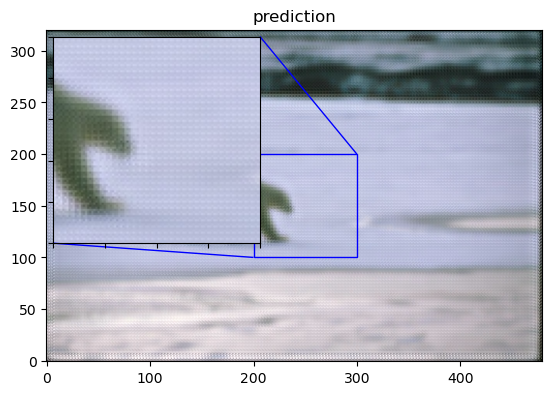

50/50 - 1s - loss: 0.0202 - val_loss: 0.0056 - 1s/epoch - 29ms/step
Epoch 2/100
Mean PSNR for epoch: 24.73
50/50 - 1s - loss: 0.0046 - val_loss: 0.0033 - 848ms/epoch - 17ms/step
Epoch 3/100
Mean PSNR for epoch: 25.82
50/50 - 1s - loss: 0.0034 - val_loss: 0.0028 - 807ms/epoch - 16ms/step
Epoch 4/100
Mean PSNR for epoch: 26.10
50/50 - 1s - loss: 0.0031 - val_loss: 0.0026 - 836ms/epoch - 17ms/step
Epoch 5/100
Mean PSNR for epoch: 26.39
50/50 - 1s - loss: 0.0030 - val_loss: 0.0027 - 814ms/epoch - 16ms/step
Epoch 6/100
Mean PSNR for epoch: 25.92
50/50 - 1s - loss: 0.0029 - val_loss: 0.0025 - 846ms/epoch - 17ms/step
Epoch 7/100
Mean PSNR for epoch: 26.88
50/50 - 1s - loss: 0.0028 - val_loss: 0.0025 - 850ms/epoch - 17ms/step
Epoch 8/100
Mean PSNR for epoch: 26.22
50/50 - 1s - loss: 0.0028 - val_loss: 0.0025 - 815ms/epoch - 16ms/step
Epoch 9/100
Mean PSNR for epoch: 25.17
50/50 - 1s - loss: 0.0030 - val_loss: 0.0032 - 815ms/epoch - 16ms/step
Epoch 10/100
Mean PSNR for epoch: 26.15
50/50 - 1s -

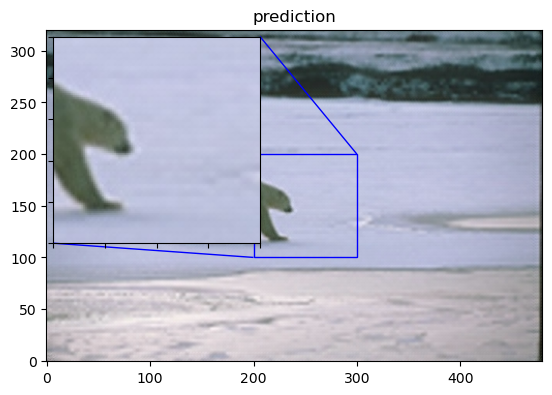

50/50 - 1s - loss: 0.0027 - val_loss: 0.0024 - 1s/epoch - 22ms/step
Epoch 22/100
Mean PSNR for epoch: 26.58
50/50 - 1s - loss: 0.0026 - val_loss: 0.0023 - 833ms/epoch - 17ms/step
Epoch 23/100
Mean PSNR for epoch: 26.73
50/50 - 1s - loss: 0.0026 - val_loss: 0.0023 - 834ms/epoch - 17ms/step
Epoch 24/100
Mean PSNR for epoch: 26.70
50/50 - 1s - loss: 0.0026 - val_loss: 0.0023 - 814ms/epoch - 16ms/step
Epoch 25/100
Mean PSNR for epoch: 26.36
50/50 - 1s - loss: 0.0026 - val_loss: 0.0023 - 826ms/epoch - 17ms/step
Epoch 26/100
Mean PSNR for epoch: 26.16
50/50 - 1s - loss: 0.0026 - val_loss: 0.0023 - 830ms/epoch - 17ms/step
Epoch 27/100
Mean PSNR for epoch: 26.31
50/50 - 1s - loss: 0.0027 - val_loss: 0.0024 - 811ms/epoch - 16ms/step
Epoch 28/100
Mean PSNR for epoch: 26.17
50/50 - 1s - loss: 0.0027 - val_loss: 0.0024 - 846ms/epoch - 17ms/step
Epoch 29/100
Mean PSNR for epoch: 26.46
50/50 - 1s - loss: 0.0026 - val_loss: 0.0023 - 829ms/epoch - 17ms/step
Epoch 30/100
Mean PSNR for epoch: 26.34
50/5

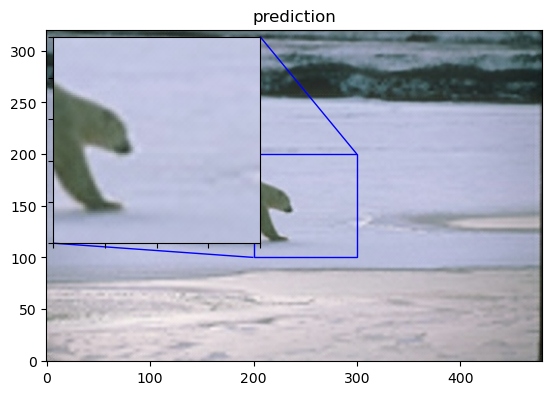

50/50 - 1s - loss: 0.0025 - val_loss: 0.0023 - 1s/epoch - 23ms/step
Epoch 42/100
Mean PSNR for epoch: 26.21
50/50 - 1s - loss: 0.0025 - val_loss: 0.0023 - 863ms/epoch - 17ms/step
Epoch 43/100
Mean PSNR for epoch: 26.29
50/50 - 1s - loss: 0.0025 - val_loss: 0.0023 - 870ms/epoch - 17ms/step
Epoch 44/100
Mean PSNR for epoch: 27.27
50/50 - 1s - loss: 0.0025 - val_loss: 0.0023 - 860ms/epoch - 17ms/step
Epoch 45/100
Mean PSNR for epoch: 26.80
50/50 - 1s - loss: 0.0025 - val_loss: 0.0023 - 828ms/epoch - 17ms/step
Epoch 46/100
Mean PSNR for epoch: 26.35
50/50 - 1s - loss: 0.0025 - val_loss: 0.0023 - 861ms/epoch - 17ms/step
Epoch 47/100
Mean PSNR for epoch: 26.63
50/50 - 1s - loss: 0.0025 - val_loss: 0.0023 - 853ms/epoch - 17ms/step
Epoch 48/100
Mean PSNR for epoch: 26.65
50/50 - 1s - loss: 0.0025 - val_loss: 0.0023 - 848ms/epoch - 17ms/step
Epoch 49/100
Mean PSNR for epoch: 26.40
50/50 - 1s - loss: 0.0025 - val_loss: 0.0023 - 863ms/epoch - 17ms/step
Epoch 50/100
Mean PSNR for epoch: 26.62
50/5

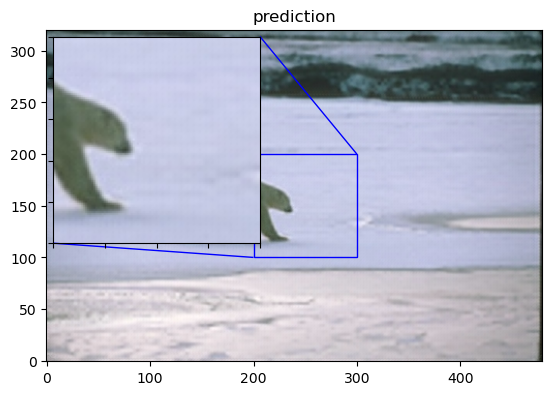

50/50 - 1s - loss: 0.0026 - val_loss: 0.0026 - 1s/epoch - 22ms/step
Epoch 62/100
Mean PSNR for epoch: 26.60
50/50 - 1s - loss: 0.0026 - val_loss: 0.0023 - 826ms/epoch - 17ms/step
Epoch 63/100
Mean PSNR for epoch: 26.78
50/50 - 1s - loss: 0.0025 - val_loss: 0.0023 - 866ms/epoch - 17ms/step
Epoch 64/100
Mean PSNR for epoch: 26.65
50/50 - 1s - loss: 0.0025 - val_loss: 0.0022 - 922ms/epoch - 18ms/step
Epoch 65/100
Mean PSNR for epoch: 26.79
50/50 - 1s - loss: 0.0025 - val_loss: 0.0023 - 899ms/epoch - 18ms/step
Epoch 66/100
Mean PSNR for epoch: 26.13
50/50 - 1s - loss: 0.0025 - val_loss: 0.0022 - 867ms/epoch - 17ms/step
Epoch 67/100
Mean PSNR for epoch: 26.46
50/50 - 1s - loss: 0.0025 - val_loss: 0.0023 - 882ms/epoch - 18ms/step
Epoch 68/100
Mean PSNR for epoch: 25.49
50/50 - 1s - loss: 0.0026 - val_loss: 0.0027 - 872ms/epoch - 17ms/step
Epoch 69/100
Mean PSNR for epoch: 26.07
50/50 - 1s - loss: 0.0039 - val_loss: 0.0025 - 817ms/epoch - 16ms/step
Epoch 70/100
Mean PSNR for epoch: 26.32
50/5

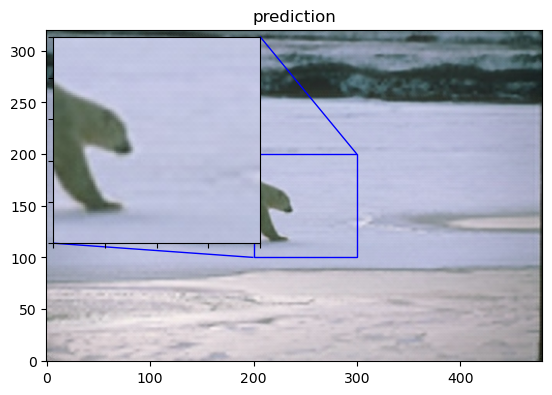

50/50 - 1s - loss: 0.0025 - val_loss: 0.0022 - 1s/epoch - 23ms/step
Epoch 82/100
Mean PSNR for epoch: 26.58
50/50 - 1s - loss: 0.0025 - val_loss: 0.0022 - 842ms/epoch - 17ms/step
Epoch 83/100
Mean PSNR for epoch: 26.82
50/50 - 1s - loss: 0.0025 - val_loss: 0.0022 - 855ms/epoch - 17ms/step
Epoch 84/100
Mean PSNR for epoch: 26.77
50/50 - 1s - loss: 0.0025 - val_loss: 0.0022 - 848ms/epoch - 17ms/step
Epoch 85/100
Mean PSNR for epoch: 26.70
50/50 - 1s - loss: 0.0025 - val_loss: 0.0022 - 833ms/epoch - 17ms/step
Epoch 86/100
Mean PSNR for epoch: 26.51
50/50 - 1s - loss: 0.0025 - val_loss: 0.0022 - 826ms/epoch - 17ms/step
Epoch 87/100
Mean PSNR for epoch: 26.83
50/50 - 1s - loss: 0.0025 - val_loss: 0.0022 - 837ms/epoch - 17ms/step
Epoch 88/100
Mean PSNR for epoch: 26.39
50/50 - 1s - loss: 0.0025 - val_loss: 0.0022 - 860ms/epoch - 17ms/step
Epoch 89/100
Mean PSNR for epoch: 26.37
50/50 - 1s - loss: 0.0025 - val_loss: 0.0022 - 838ms/epoch - 17ms/step
Epoch 90/100
Mean PSNR for epoch: 27.26
50/5

In [14]:
epochs = 100

model.compile(
    optimizer=optimizer, loss=loss_fn,
)

model.fit(
    train_ds, epochs=epochs, callbacks=callbacks, validation_data=valid_ds, verbose=2
)

# The model weights (that are considered the best) are loaded into the model.
model.load_weights(checkpoint_filepath)

1/1 [==============================] - 0s 16ms/step
PSNR of low resolution image and high resolution image is 30.0157
PSNR of predict and high resolution is 30.5637


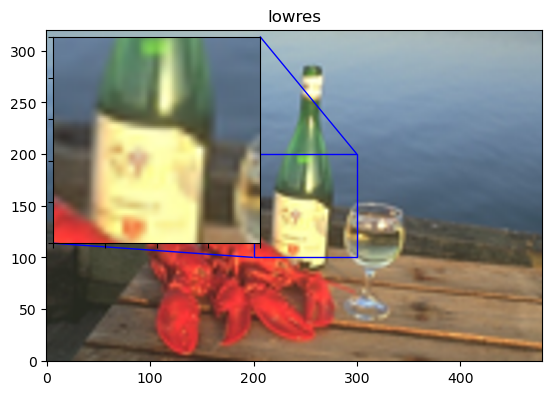

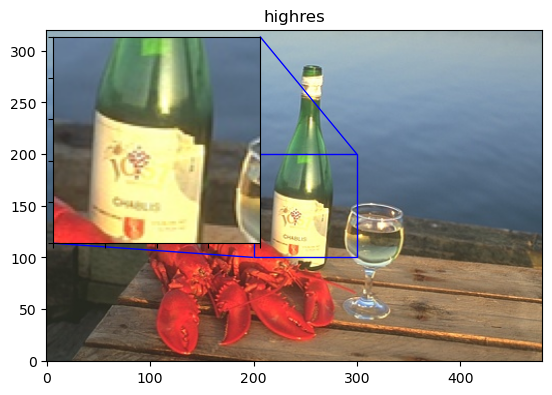

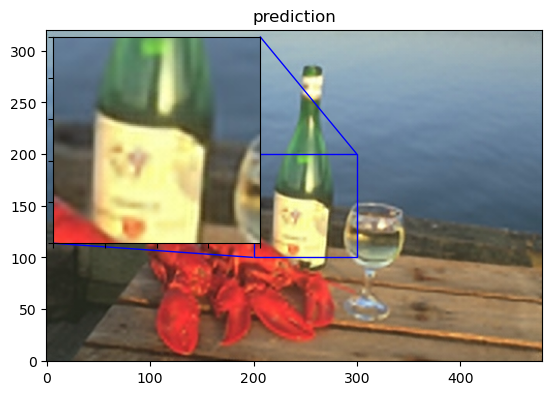

1/1 [==============================] - 0s 9ms/step
PSNR of low resolution image and high resolution image is 25.1103
PSNR of predict and high resolution is 26.1183


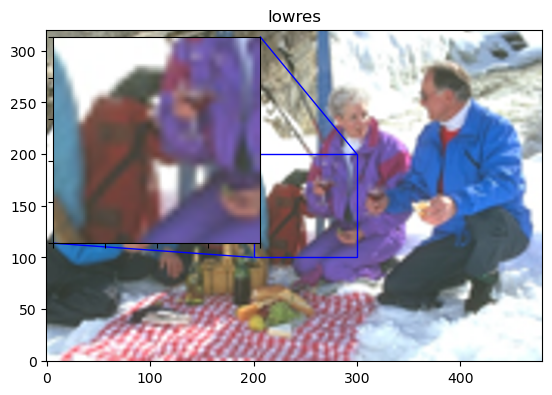

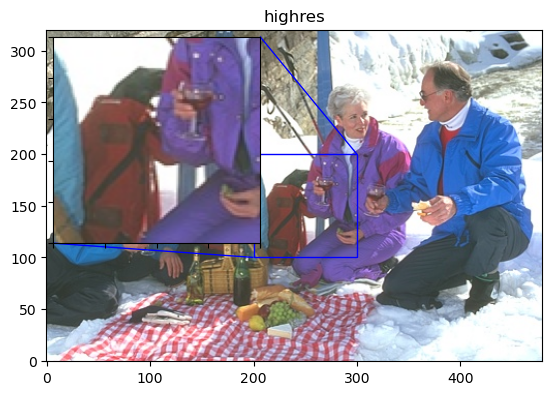

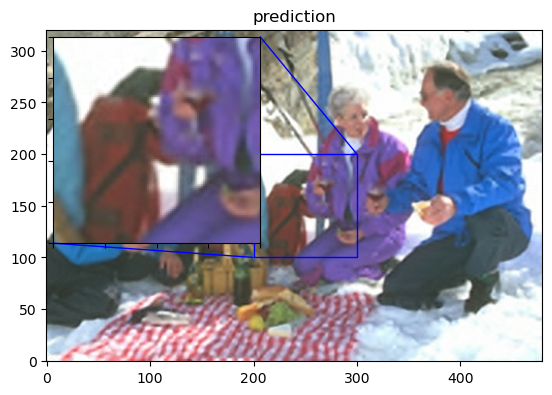

1/1 [==============================] - 0s 79ms/step
PSNR of low resolution image and high resolution image is 27.7789
PSNR of predict and high resolution is 28.4150


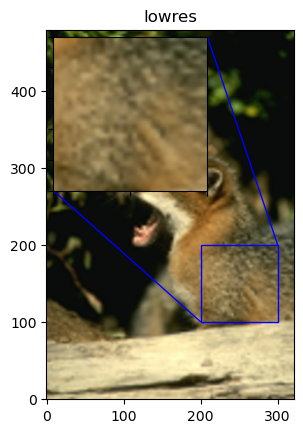

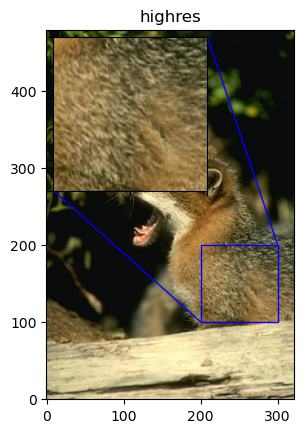

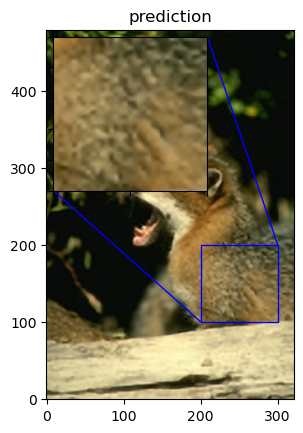

1/1 [==============================] - 0s 10ms/step
PSNR of low resolution image and high resolution image is 28.0321
PSNR of predict and high resolution is 28.2769


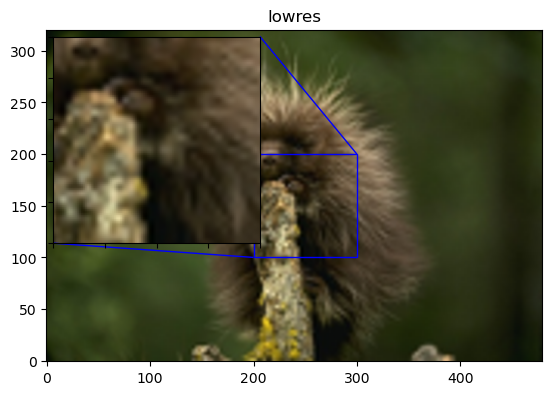

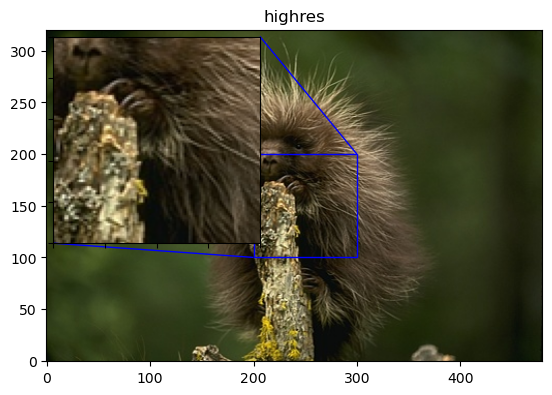

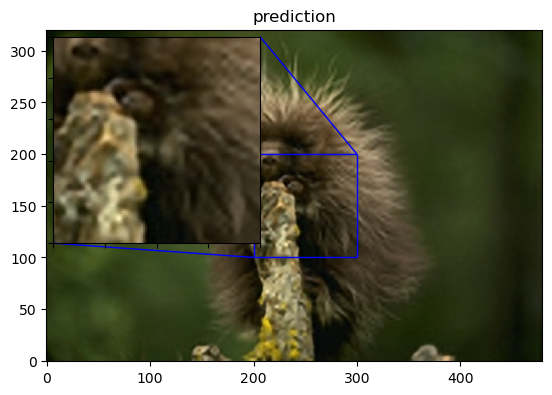

1/1 [==============================] - 0s 11ms/step
PSNR of low resolution image and high resolution image is 25.7853
PSNR of predict and high resolution is 26.3877


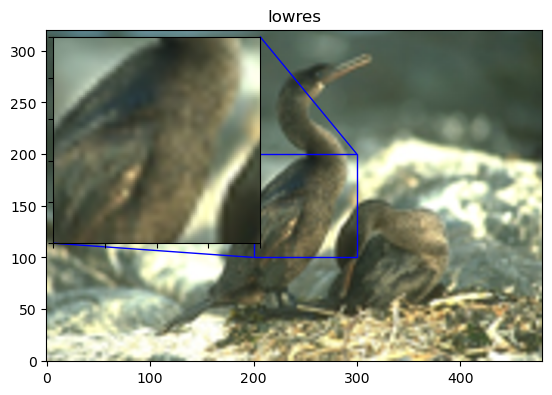

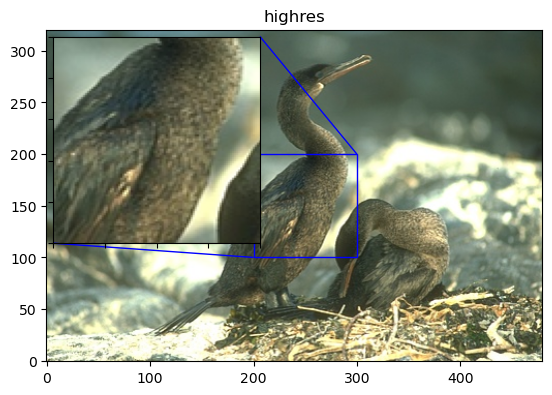

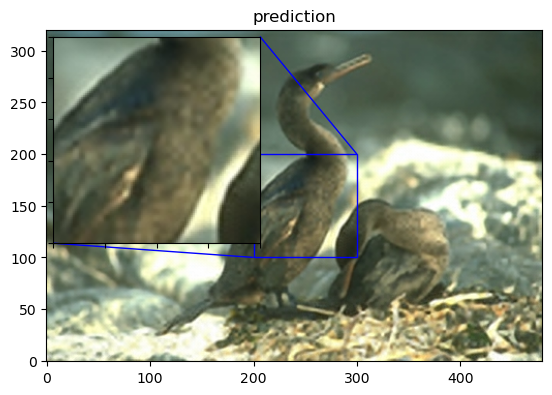

1/1 [==============================] - 0s 10ms/step
PSNR of low resolution image and high resolution image is 25.9181
PSNR of predict and high resolution is 26.7418


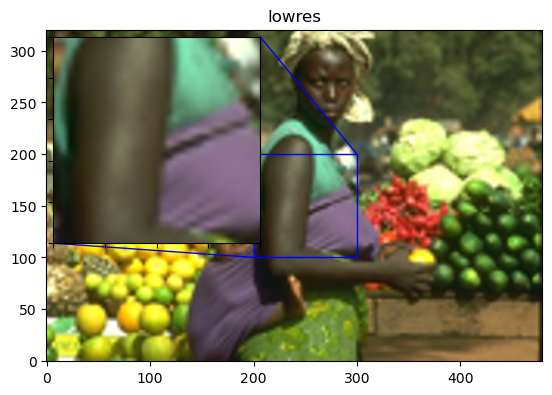

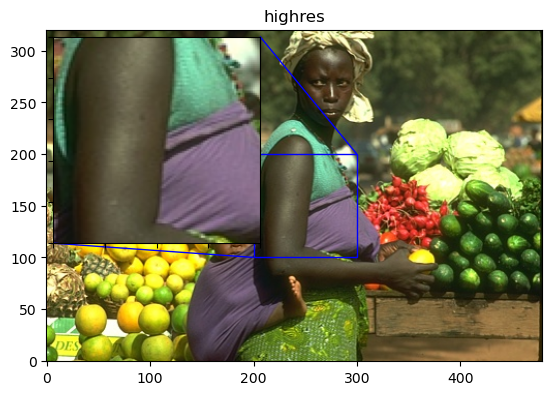

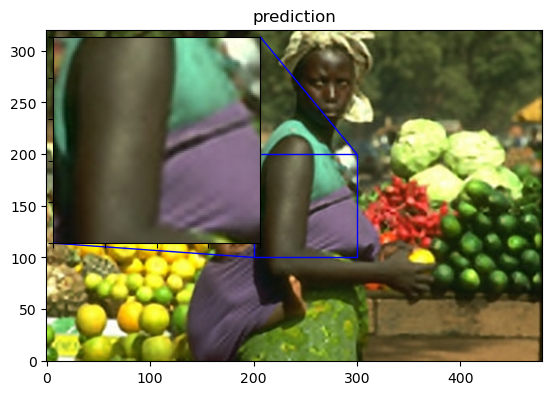

1/1 [==============================] - 0s 10ms/step
PSNR of low resolution image and high resolution image is 26.2389
PSNR of predict and high resolution is 27.1855


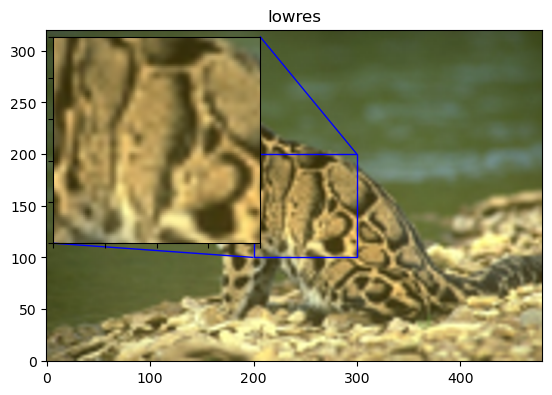

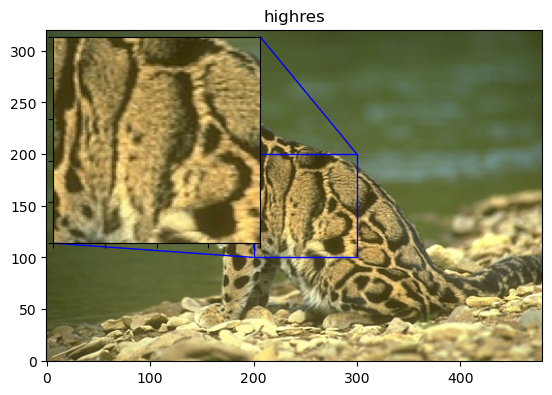

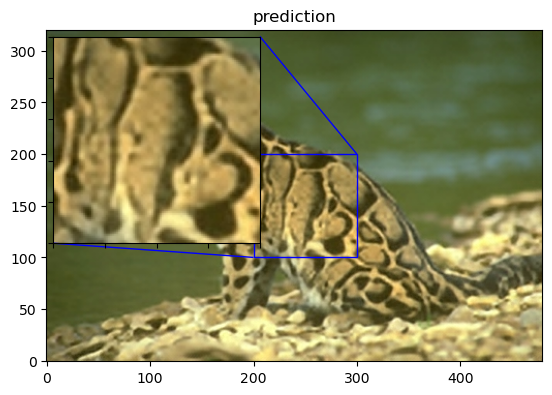

1/1 [==============================] - 0s 10ms/step
PSNR of low resolution image and high resolution image is 23.3281
PSNR of predict and high resolution is 24.6379


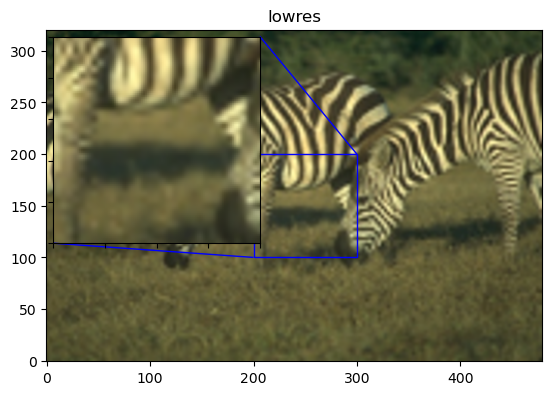

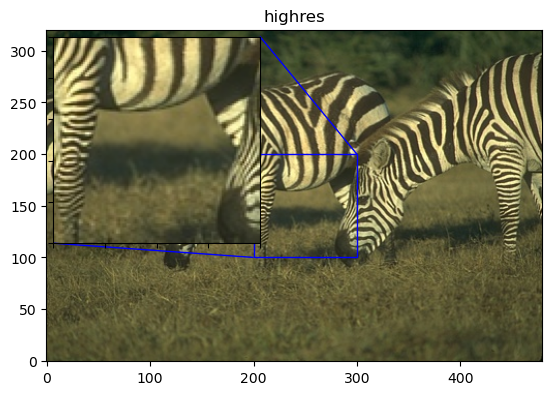

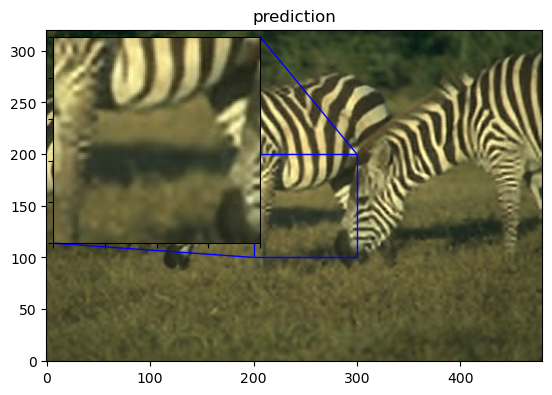

1/1 [==============================] - 0s 11ms/step
PSNR of low resolution image and high resolution image is 29.9008
PSNR of predict and high resolution is 30.0728


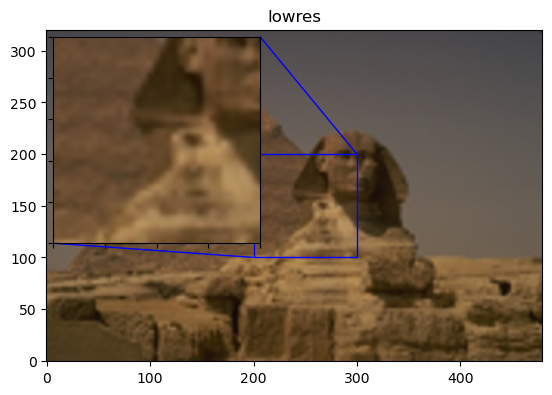

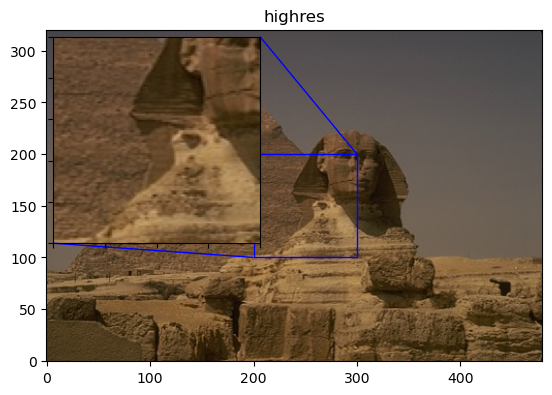

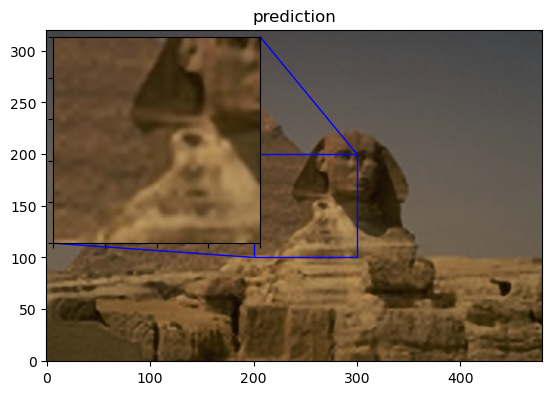

1/1 [==============================] - 0s 10ms/step
PSNR of low resolution image and high resolution image is 25.2492
PSNR of predict and high resolution is 25.8066


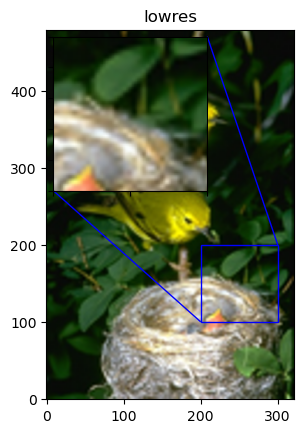

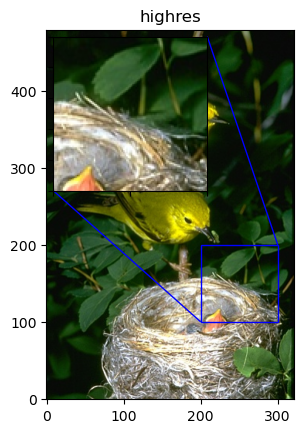

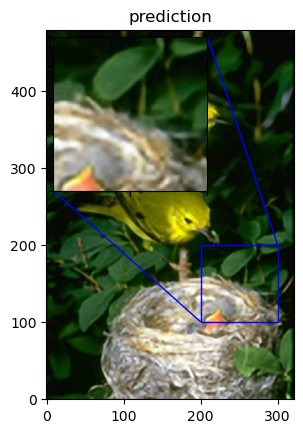

Avg. PSNR of lowres images is 26.7357
Avg. PSNR of reconstructions is 27.4206


In [15]:
total_bicubic_psnr = 0.0
total_test_psnr = 0.0

for index, test_img_path in enumerate(test_img_paths[50:60]):
    img = load_img(test_img_path)
    lowres_input = get_lowres_image(img, upscale_factor)
    w = lowres_input.size[0] * upscale_factor
    h = lowres_input.size[1] * upscale_factor
    highres_img = img.resize((w, h))
    prediction = upscale_image(model, lowres_input)
    lowres_img = lowres_input.resize((w, h))
    lowres_img_arr = img_to_array(lowres_img)
    highres_img_arr = img_to_array(highres_img)
    predict_img_arr = img_to_array(prediction)
    bicubic_psnr = tf.image.psnr(lowres_img_arr, highres_img_arr, max_val=255)
    test_psnr = tf.image.psnr(predict_img_arr, highres_img_arr, max_val=255)

    total_bicubic_psnr += bicubic_psnr
    total_test_psnr += test_psnr

    print(
        "PSNR of low resolution image and high resolution image is %.4f" % bicubic_psnr
    )
    print("PSNR of predict and high resolution is %.4f" % test_psnr)
    plot_results(lowres_img, index, "lowres")
    plot_results(highres_img, index, "highres")
    plot_results(prediction, index, "prediction")

print("Avg. PSNR of lowres images is %.4f" % (total_bicubic_psnr / 10))
print("Avg. PSNR of reconstructions is %.4f" % (total_test_psnr / 10))